In [2]:
!pip install dataprep

  Using cached dataprep-0.4.5-py3-none-any.whl (9.9 MB)
     ---------------------------------------- 1.0/1.0 MB 195.7 kB/s eta 0:00:00
  Using cached SQLAlchemy-1.3.24-cp39-cp39-win_amd64.whl (1.2 MB)
  Using cached jsonpath_ng-1.5.3-py3-none-any.whl (29 kB)
  Using cached Jinja2-3.0.3-py3-none-any.whl (133 kB)
     ---------------------------------------- 1.0/1.0 MB 193.9 kB/s eta 0:00:00
  Using cached aiohttp-3.8.3-cp39-cp39-win_amd64.whl (323 kB)
  Using cached Flask-2.2.2-py3-none-any.whl (101 kB)
  Using cached regex-2021.11.10-cp39-cp39-win_amd64.whl (273 kB)
  Using cached python_crfsuite-0.9.8-cp39-cp39-win_amd64.whl (158 kB)
  Using cached varname-0.8.3-py3-none-any.whl (21 kB)
  Using cached Metaphone-0.6-py3-none-any.whl
  Using cached Flask_Cors-3.0.10-py2.py3-none-any.whl (14 kB)
     --------------------------------------- 56.7/56.7 kB 70.8 kB/s eta 0:00:00
  Using cached async_timeout-4.0.2-py3-none-any.whl (5.8 kB)
  Using cached Werkzeug-2.2.2-py3-none-any.whl (232 k

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
anaconda-project 0.11.1 requires ruamel-yaml, which is not installed.


In [3]:
# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from collections import Counter
sns.set_style('darkgrid')
from imblearn.pipeline import Pipeline
from dataprep.eda import plot, plot_correlation, plot_missing, create_report
import plotly.express as px
from plotly.offline import plot as off
import plotly.figure_factory as ff
import plotly.io as pio
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, scale
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score, \
                                    train_test_split, RandomizedSearchCV
import warnings
warnings.filterwarnings('ignore')
from keras.optimizers import Adam
from kerastuner.tuners import RandomSearch
from tensorflow.keras import layers
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import np_utils
from keras.constraints import maxnorm
from keras.wrappers.scikit_learn import KerasRegressor, KerasClassifier
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression

In [4]:
# Import Dataset
df = pd.read_csv(r'C:\Users\hp\Desktop\ExcelR\Assignments Folder\1Neural Network\forestfires (3).csv')
df

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,small
516,nov,tue,79.5,3.0,106.7,1.1,11.8,31.0,4.5,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,small
517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
518,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df.isnull().any()

month             True
day               True
FFMC              True
DMC               True
DC                True
ISI               True
temp              True
RH                True
wind              True
rain              True
area             False
dayfri            True
daymon            True
daysat            True
daysun            True
daythu            True
daytue            True
daywed            True
monthapr          True
monthaug          True
monthdec          True
monthfeb          True
monthjan          True
monthjul          True
monthjun          True
monthmar          True
monthmay          True
monthnov          True
monthoct          True
monthsep          True
size_category     True
dtype: bool

In [6]:
df.isnull().sum()


month            3
day              3
FFMC             3
DMC              3
DC               3
ISI              3
temp             3
RH               3
wind             3
rain             3
area             0
dayfri           3
daymon           3
daysat           3
daysun           3
daythu           3
daytue           3
daywed           3
monthapr         3
monthaug         3
monthdec         3
monthfeb         3
monthjan         3
monthjul         3
monthjun         3
monthmar         3
monthmay         3
monthnov         3
monthoct         3
monthsep         3
size_category    3
dtype: int64

In [7]:
df.shape

(520, 31)

In [8]:
df.dtypes

month             object
day               object
FFMC             float64
DMC              float64
DC               float64
ISI              float64
temp             float64
RH               float64
wind             float64
rain             float64
area             float64
dayfri           float64
daymon           float64
daysat           float64
daysun           float64
daythu           float64
daytue           float64
daywed           float64
monthapr         float64
monthaug         float64
monthdec         float64
monthfeb         float64
monthjan         float64
monthjul         float64
monthjun         float64
monthmar         float64
monthmay         float64
monthnov         float64
monthoct         float64
monthsep         float64
size_category     object
dtype: object

In [9]:
#Unique values for every feature
df.nunique()

month             12
day                7
FFMC             106
DMC              215
DC               219
ISI              119
temp             192
RH                75
wind              21
rain               7
area             252
dayfri             2
daymon             2
daysat             2
daysun             2
daythu             2
daytue             2
daywed             2
monthapr           2
monthaug           2
monthdec           2
monthfeb           2
monthjan           2
monthjul           2
monthjun           2
monthmar           2
monthmay           2
monthnov           2
monthoct           2
monthsep           2
size_category      2
dtype: int64

In [10]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 520 entries, 0 to 519
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    float64
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           520 non-null    float64
 11  dayfri         517 non-null    float64
 12  daymon         517 non-null    float64
 13  daysat         517 non-null    float64
 14  daysun         517 non-null    float64
 15  daythu         517 non-null    float64
 16  daytue         517 non-null    float64
 17  daywed         517 non-null    float64
 18  monthapr  

In [11]:
df[df.duplicated()].shape


(8, 31)

In [12]:
df[df.duplicated()]


,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
53,aug,wed,92.1,111.2,654.1,9.6,20.4,42.0,4.9,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,small
100,aug,sun,91.4,142.4,601.4,10.6,19.8,39.0,5.4,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,small
215,mar,sat,91.7,35.8,80.8,7.8,17.0,27.0,4.9,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,large
303,jun,fri,91.1,94.1,232.1,7.1,19.2,38.0,4.5,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,small
426,aug,thu,91.6,248.4,753.8,6.3,20.4,56.0,2.2,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,small
461,aug,sat,93.7,231.1,715.1,8.4,18.9,64.0,4.9,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,small
501,aug,tue,96.1,181.1,671.2,14.3,21.6,65.0,4.9,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,small
508,aug,fri,91.0,166.9,752.6,7.1,25.9,41.0,3.6,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,small


In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
FFMC,517.0,90.644681,5.520111,18.7,90.2,91.60,92.9000,96.20
DMC,517.0,110.872340,64.046482,1.1,68.6,108.30,142.4000,291.30
DC,517.0,547.940039,248.066192,7.9,437.7,664.20,713.9000,860.60
ISI,517.0,9.021663,4.559477,0.0,6.5,8.40,10.8000,56.10
temp,517.0,18.889168,5.806625,2.2,15.5,19.30,22.8000,33.30
RH,517.0,44.288201,16.317469,15.0,33.0,42.00,53.0000,100.00
wind,517.0,4.017602,1.791653,0.4,2.7,4.00,4.9000,9.40
rain,517.0,0.021663,0.295959,0.0,0.0,0.00,0.0000,6.40
area,520.0,14.895649,79.144220,0.0,0.0,0.53,6.5875,1090.84
dayfri,517.0,0.164410,0.371006,0.0,0.0,0.00,0.0000,1.00


In [14]:
df.corr()["area"].sort_values(ascending=False)

area        1.000000
temp        0.097844
daysat      0.087868
DMC         0.072994
monthsep    0.056573
DC          0.049383
FFMC        0.040122
daythu      0.020121
wind        0.012317
ISI         0.008258
monthmay    0.006264
monthjul    0.006149
monthdec    0.001010
daytue     -0.001333
monthaug   -0.004187
rain       -0.007366
monthapr   -0.008280
monthnov   -0.008893
daywed     -0.011452
monthjan   -0.012589
monthoct   -0.016878
monthjun   -0.020314
daysun     -0.020463
monthfeb   -0.020732
daymon     -0.021206
monthmar   -0.045596
dayfri     -0.052911
RH         -0.075519
Name: area, dtype: float64

In [15]:
numerical_features = df.describe(include=["int64","float64"]).columns
numerical_features

Index(['FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area',
       'dayfri', 'daymon', 'daysat', 'daysun', 'daythu', 'daytue', 'daywed',
       'monthapr', 'monthaug', 'monthdec', 'monthfeb', 'monthjan', 'monthjul',
       'monthjun', 'monthmar', 'monthmay', 'monthnov', 'monthoct', 'monthsep'],
      dtype='object')

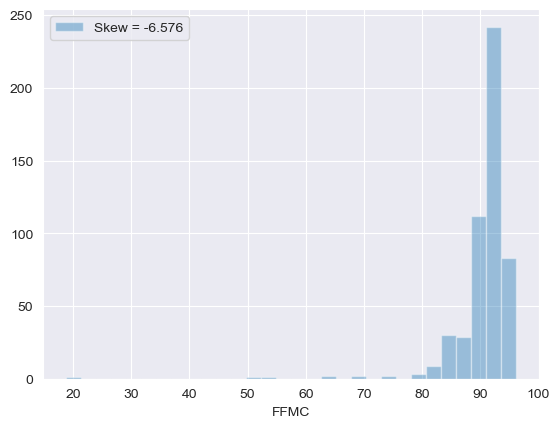

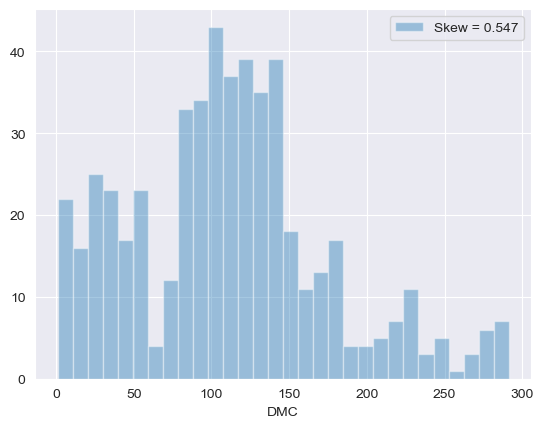

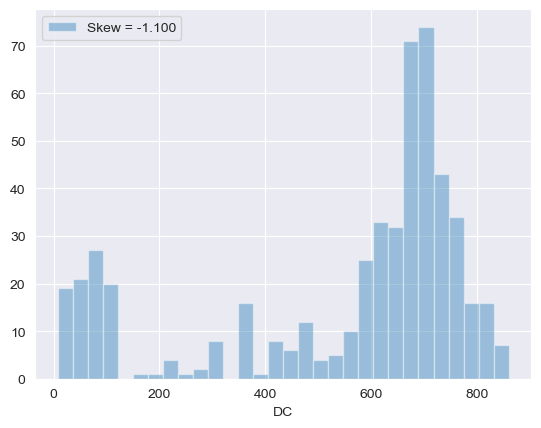

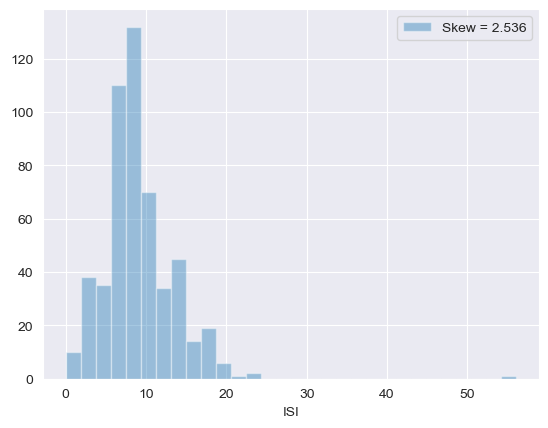

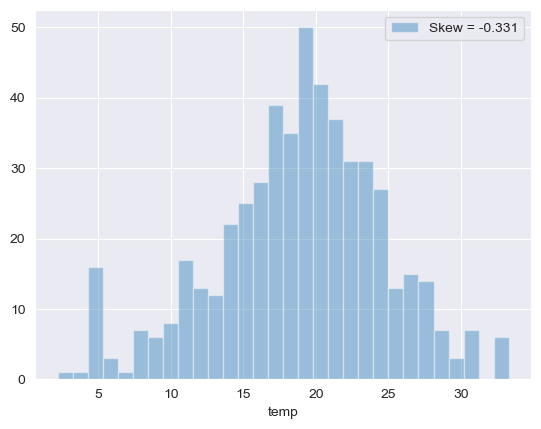

...

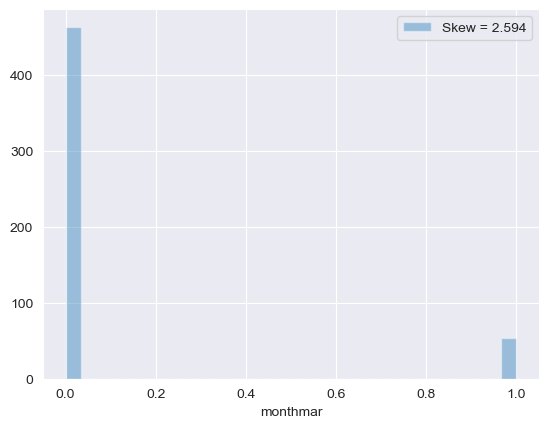

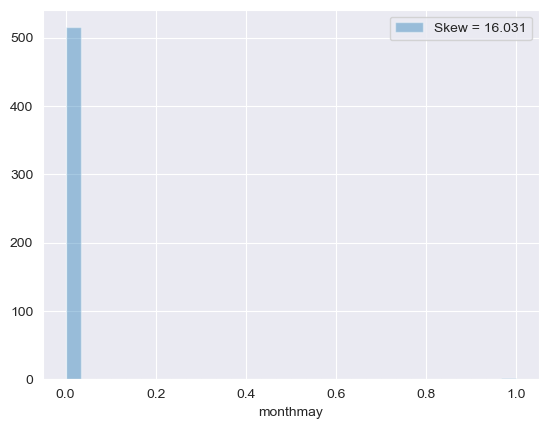

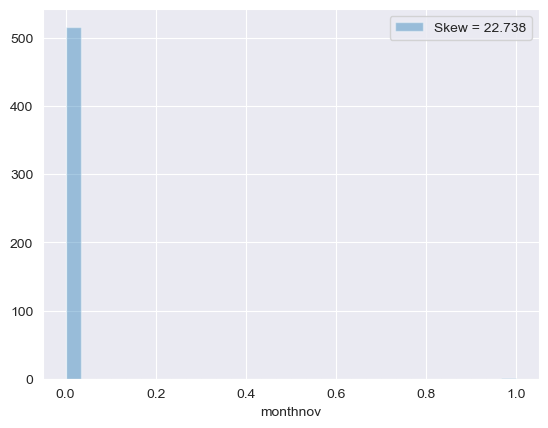

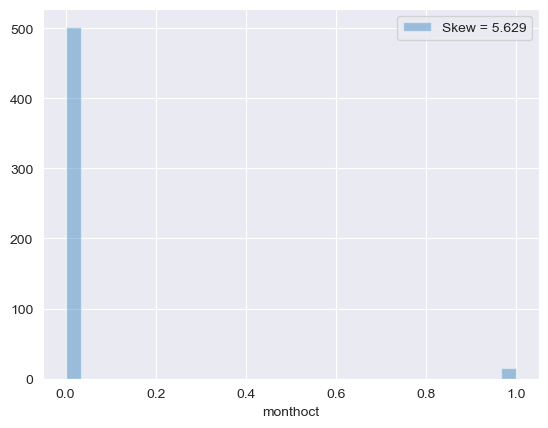

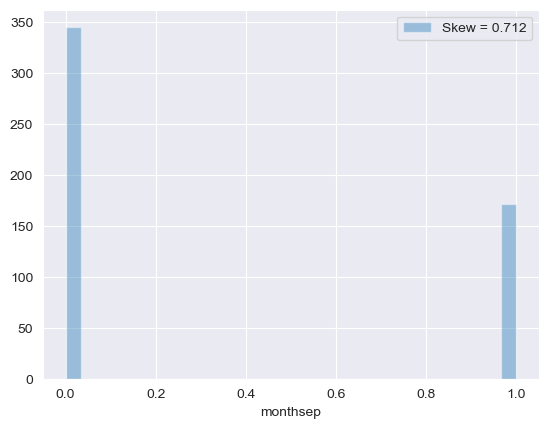

In [16]:
numerical_features=[feature for feature in df.columns if df[feature].dtypes != 'O']
for feat in numerical_features:
    skew = df[feat].skew()
    sns.distplot(df[feat], kde= False, label='Skew = %.3f' %(skew), bins=30)
    plt.legend(loc='best')
    plt.show()

In [17]:
# Detect observations with more than one outlier

def outlier_hunt(df):
    """
    Takes a dataframe df of features and returns a list of the indices
    corresponding to the observations containing more than 2 outliers. 
    """
    outlier_indices = []
    
    # iterate over features(columns)
    for col in df.columns.tolist():
        # 1st quartile (25%)
        Q1 = np.percentile(df[col], 25)
        
        # 3rd quartile (75%)
        Q3 = np.percentile(df[col],75)
        
        # Interquartile rrange (IQR)
        IQR = Q3 - Q1
        
        # outlier step
        outlier_step = 1.5 * IQR
        
        # Determine a list of indices of outliers for feature col
        outlier_list_col = df[(df[col] < Q1 - outlier_step) | (df[col] > Q3 + outlier_step )].index
        
        # append the found outlier indices for col to the list of outlier indices 
        outlier_indices.extend(outlier_list_col)
        
    # select observations containing more than 2 outliers
    outlier_indices = Counter(outlier_indices)        
    multiple_outliers = list( k for k, v in outlier_indices.items() if v > 2 )
    
    return multiple_outliers   

print('The dataset contains %d observations with more than 2 outliers' %(len(outlier_hunt(df[numerical_features])))) 

The dataset contains 0 observations with more than 2 outliers


In [18]:
numerical_features

['FFMC',
 'DMC',
 'DC',
 'ISI',
 'temp',
 'RH',
 'wind',
 'rain',
 'area',
 'dayfri',
 'daymon',
 'daysat',
 'daysun',
 'daythu',
 'daytue',
 'daywed',
 'monthapr',
 'monthaug',
 'monthdec',
 'monthfeb',
 'monthjan',
 'monthjul',
 'monthjun',
 'monthmar',
 'monthmay',
 'monthnov',
 'monthoct',
 'monthsep']

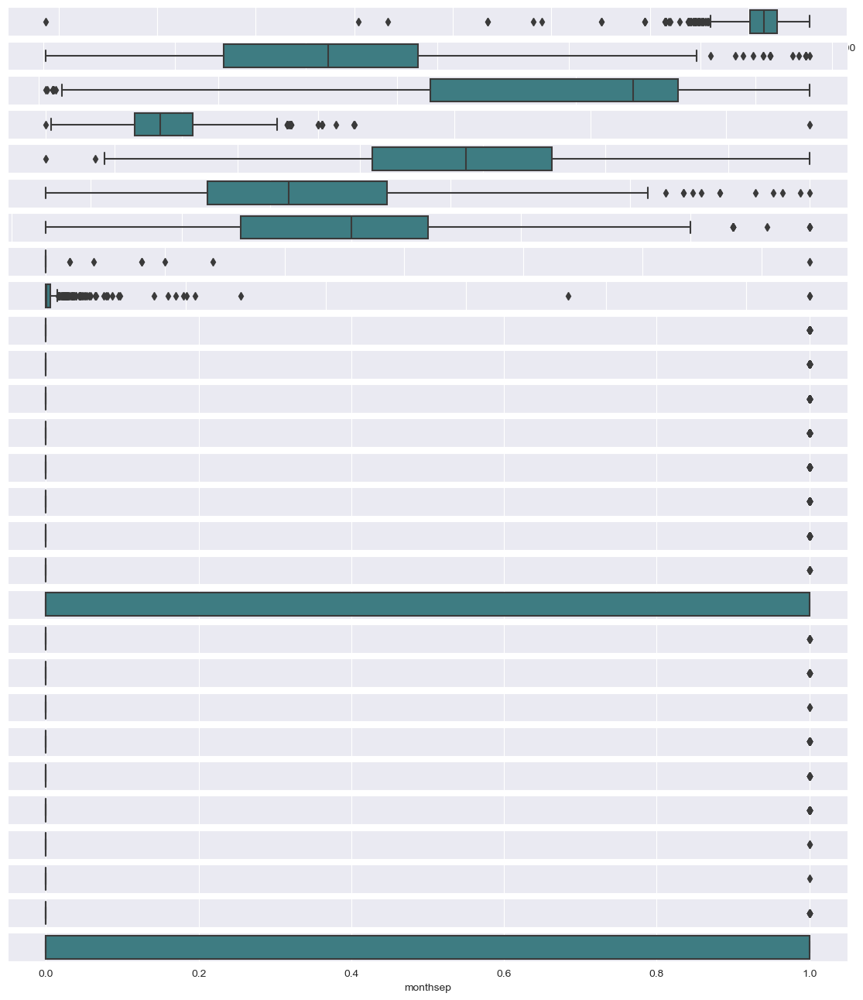

In [20]:
ot=df.copy() 
fig, axes=plt.subplots(28,1,figsize=(14,16),sharex=False,sharey=False)
sns.boxplot(x='FFMC',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='DMC',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='DC',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='ISI',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='temp',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='RH',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='wind',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='rain',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='area',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='dayfri',data=ot,palette='crest',ax=axes[9])
sns.boxplot(x='daymon',data=ot,palette='crest',ax=axes[10])
sns.boxplot(x='daysat',data=ot,palette='crest',ax=axes[11])
sns.boxplot(x='daysun',data=ot,palette='crest',ax=axes[12])
sns.boxplot(x='daythu',data=ot,palette='crest',ax=axes[13])
sns.boxplot(x='daytue',data=ot,palette='crest',ax=axes[14])
sns.boxplot(x='daywed',data=ot,palette='crest',ax=axes[15])
sns.boxplot(x='monthapr',data=ot,palette='crest',ax=axes[16])
sns.boxplot(x='monthaug',data=ot,palette='crest',ax=axes[17])
sns.boxplot(x='monthdec',data=ot,palette='crest',ax=axes[18])
sns.boxplot(x='monthfeb',data=ot,palette='crest',ax=axes[19])
sns.boxplot(x='monthjan',data=ot,palette='crest',ax=axes[20])
sns.boxplot(x='monthjul',data=ot,palette='crest',ax=axes[21])
sns.boxplot(x='monthjun',data=ot,palette='crest',ax=axes[22])
sns.boxplot(x='monthmar',data=ot,palette='crest',ax=axes[23])
sns.boxplot(x='monthmay',data=ot,palette='crest',ax=axes[24])
sns.boxplot(x='monthnov',data=ot,palette='crest',ax=axes[25])
sns.boxplot(x='monthoct',data=ot,palette='crest',ax=axes[26])
sns.boxplot(x='monthsep',data=ot,palette='crest',ax=axes[27])
plt.tight_layout(pad=2.0)

<AxesSubplot:>

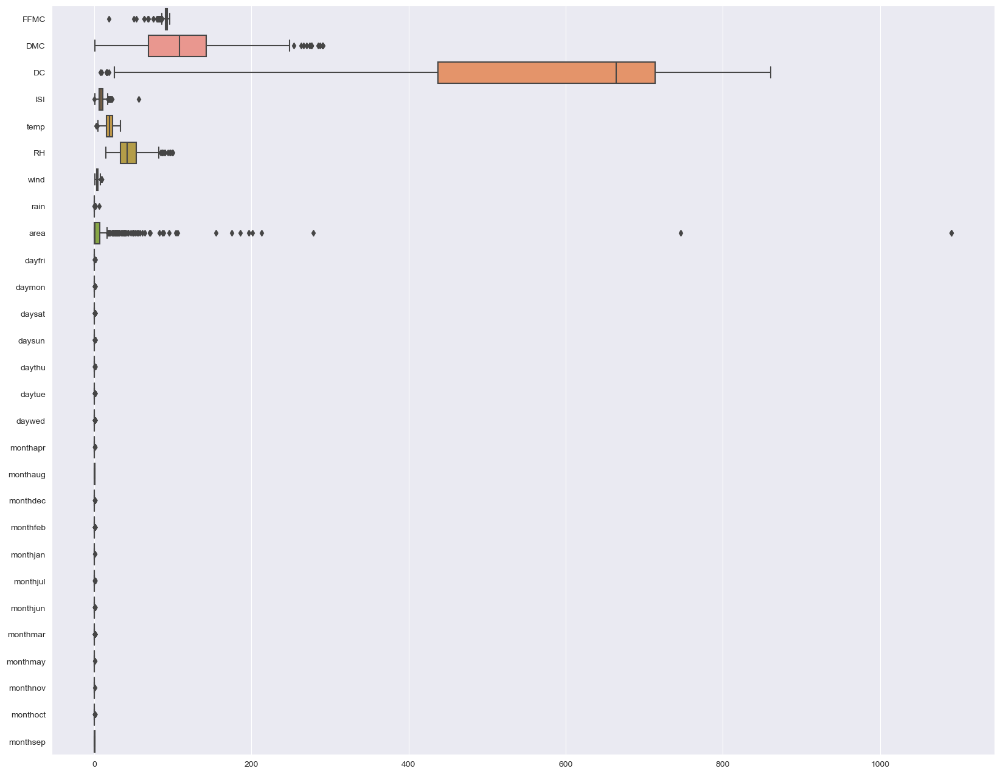

In [21]:
#outlier
plt.figure(figsize=(20,16))
sns.boxplot(data=df[numerical_features], orient="h")

Text(0.5, 1.0, 'Histogram of the Target Column')

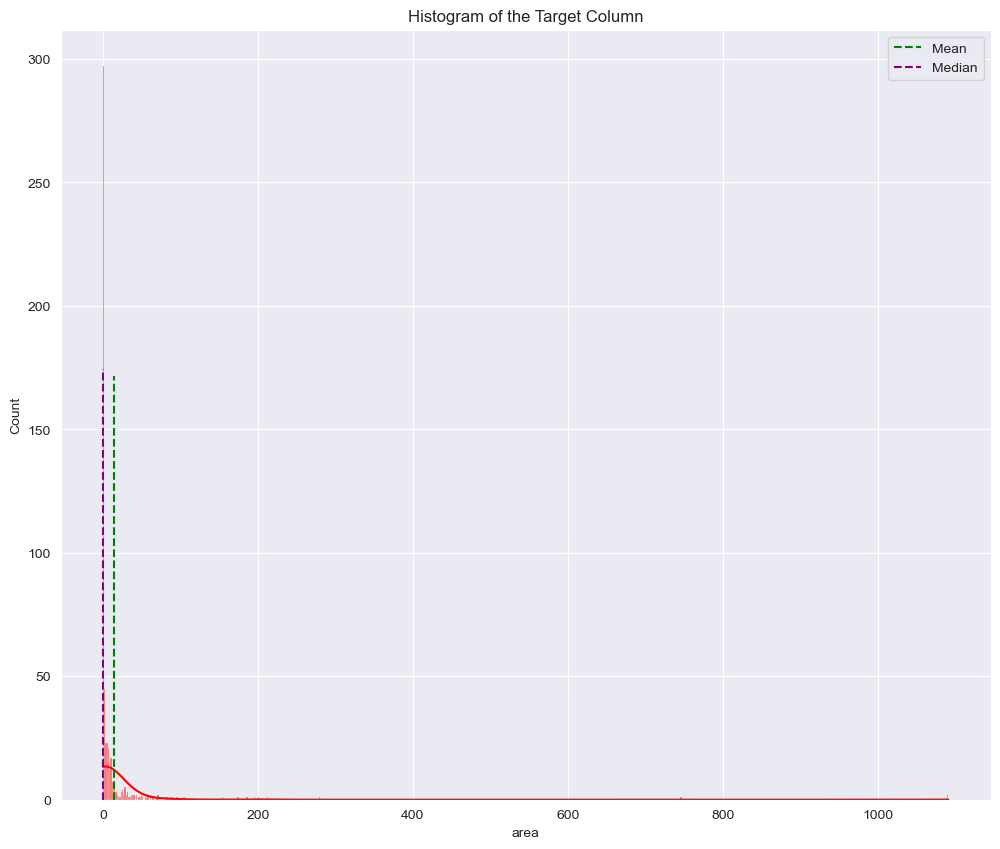

In [22]:
sns.set_style("darkgrid")
plt.figure(figsize=(12,10))
sns.histplot(data=df,x="area",color="red",kde=True)
plt.axvline(x=df["area"].mean(),ymax=0.55,color="green",linestyle='--',label="Mean")
plt.axvline(x=df["area"].median(),ymax=0.56,color="purple",linestyle='--',label="Median")
plt.legend()
plt.title("Histogram of the Target Column")

Text(0.5, 1.0, 'Cumulative of the Target Column')

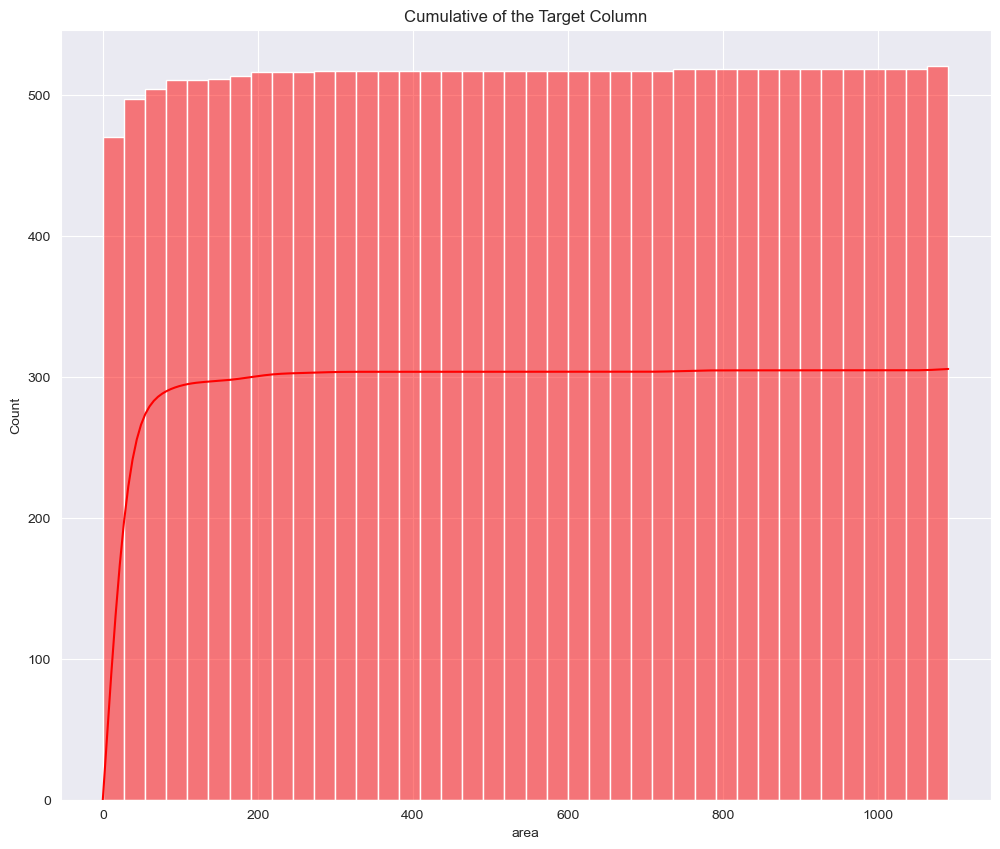

In [23]:
plt.figure(figsize = (12,10))
sns.histplot(df["area"],kde=True,bins=40,color="red",cumulative=True)
plt.title("Cumulative of the Target Column")

In [26]:
#Multivariate Analysis
for i in df.columns:
    if i!="area": 
        plt.scatter(np.log(df[i]), np.log(df['area']))
        plt.title(i+ ' vs area')
        plt.grid()
        plt.show()

TypeError: loop of ufunc does not support argument 0 of type str which has no callable log method

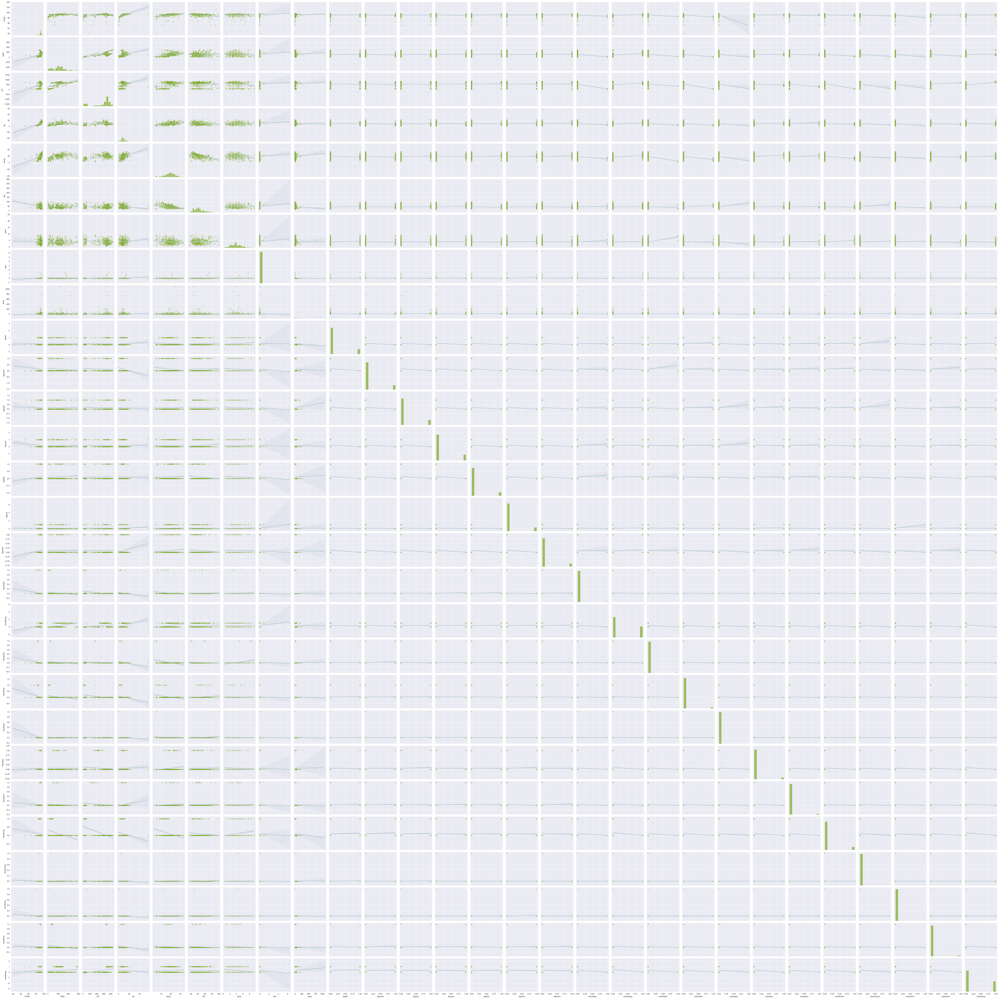

In [27]:
sns.pairplot(df,
                 markers="+",
                 kind='reg',
                 diag_kind="auto",
                 plot_kws={'line_kws':{'color':'#aec6cf'},
                           'scatter_kws': {'alpha': 0.5,
                                           'color': '#82ad32'}},
               
                 diag_kws= {'color': '#82ad32'}) 

<Figure size 2000x2000 with 0 Axes>

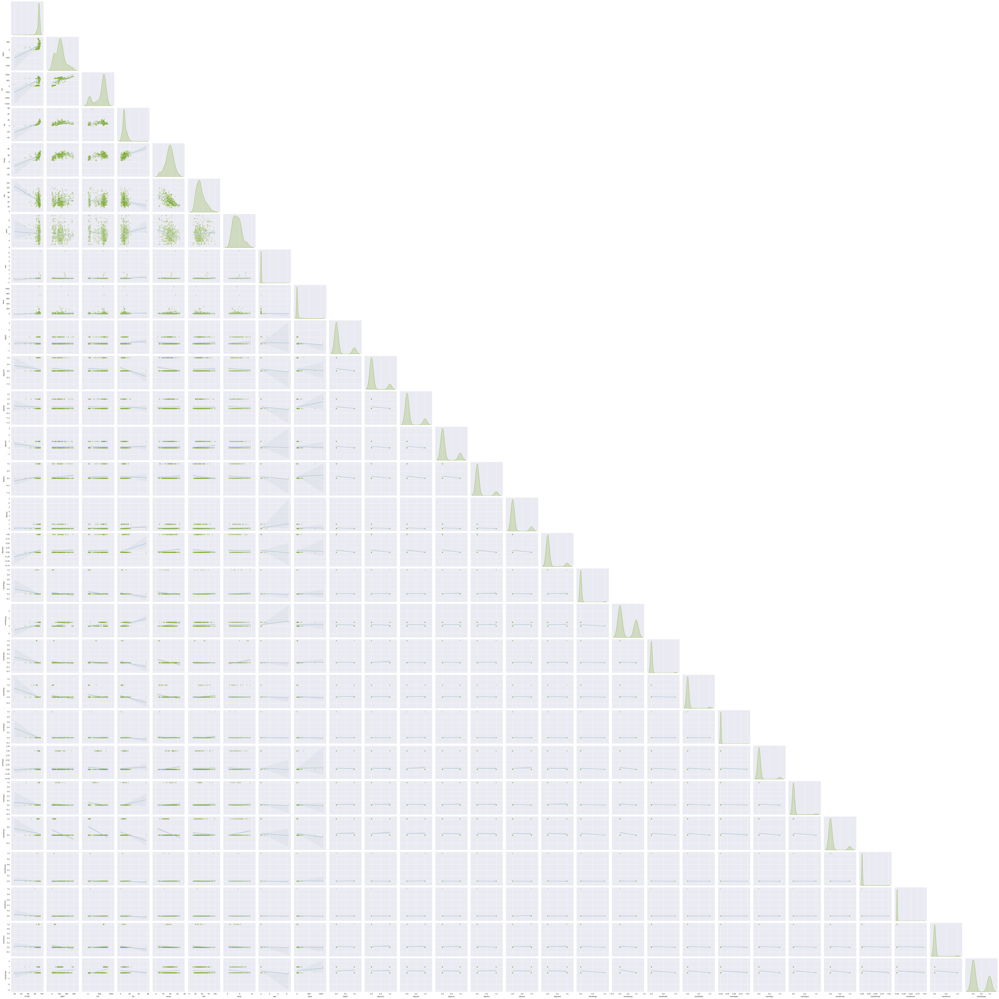

In [28]:
plt.figure(figsize=(20,20))
sns.pairplot(df,
                 markers="+",
                 kind='reg',
                 diag_kind="kde",
                 plot_kws={'line_kws':{'color':'#aec6cf'},
                           'scatter_kws': {'alpha': 0.5,
                                           'color': '#82ad32'}},
               corner=True,
                 diag_kws= {'color': '#82ad32'})

<AxesSubplot:>

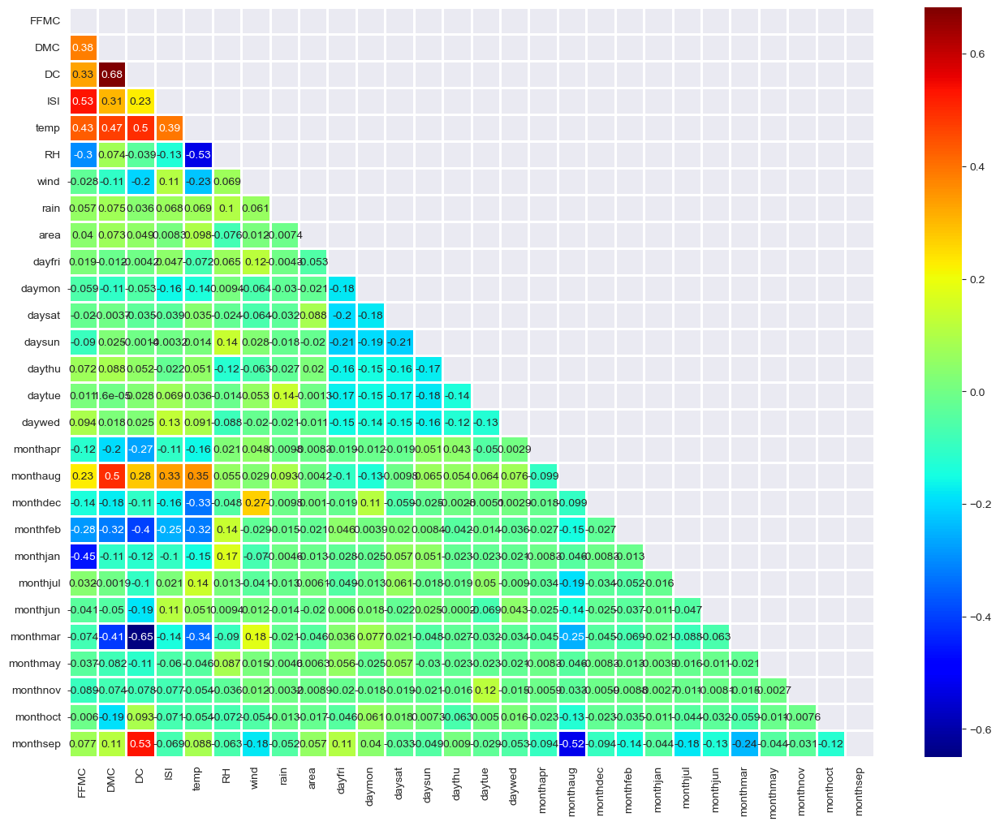

In [29]:
# Having a look at the correlation matrix

plt.figure(figsize=(16,12))
mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(data=df.corr(), cmap="jet", annot=True,linewidths=1, linecolor='white',mask=mask)

In [49]:
x = df.drop('area', axis=1)
y = df[["area"]].astype({'area': float})

Text(0.5, 1.0, 'Correlation with Area Burned \n')

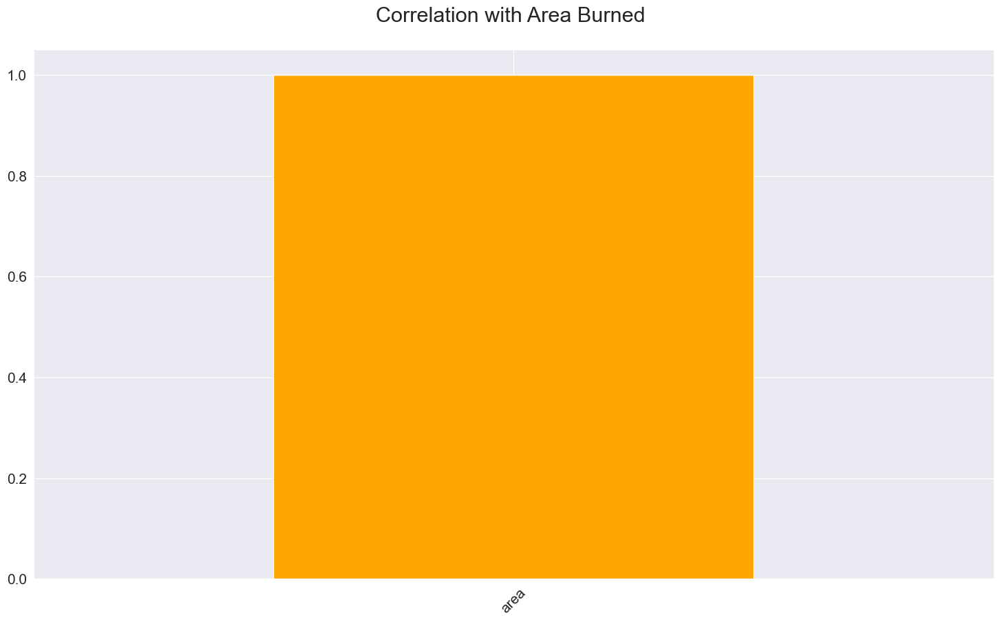

In [50]:
data2 = df.copy()

correlations = data2.corrwith(df.area)
correlations = correlations[correlations!=1]
positive_correlations = correlations[correlations >0].sort_values(ascending = False)
negative_correlations =correlations[correlations<0].sort_values(ascending = False)

correlations.plot.bar(
        figsize = (18, 10), 
        fontsize = 15, 
        color = 'orange',
        rot = 45, grid = True)
plt.title('Correlation with Area Burned \n',
horizontalalignment="center", fontstyle = "normal", 
fontsize = "22", fontfamily = "sans-serif")

In [46]:
#Feature importance
from numpy import set_printoptions

In [51]:
# feature extraction
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression
test = SelectKBest(score_func=mutual_info_regression, k='all')


NameError: name 'fit' is not defined